# AMT-APC Demo: 音频转录与钢琴翻唱生成

本 notebook 演示如何使用 AMT-APC 将音频文件转录为 MIDI，然后使用 FluidSynth 合成钢琴音频。

> Windows 兼容版本 - 移除了不支持 Windows 的 essentia 依赖

## 1. 环境设置

```bash
# 使用 uv 安装依赖
uv sync --extra dev

# 或者使用 pip
pip install -e ".[dev]"
```

FluidSynth 安装 (可选，用于合成音频):
- Windows: 下载 https://github.com/FluidSynth/fluidsynth/releases
- macOS: `brew install fluid-synth`
- Linux: `sudo apt-get install fluidsynth`

In [27]:
import sys
from pathlib import Path
import os

# 确保项目根目录在 Python 路径中
ROOT = Path.cwd()
if str(ROOT) not in sys.path:
    sys.path.insert(0, str(ROOT))

print(f"项目根目录: {ROOT}")

项目根目录: c:\Users\chen\Desktop\amt-apc


## 2. 下载预训练模型

In [28]:
import urllib.request

MODEL_URL = "https://github.com/misya11p/amt-apc/releases/download/beta/apc.pth"
MODEL_DIR = ROOT / "models" / "params"
MODEL_PATH = MODEL_DIR / "apc.pth"

MODEL_DIR.mkdir(parents=True, exist_ok=True)

if not MODEL_PATH.exists():
    print("正在下载预训练模型...")
    urllib.request.urlretrieve(MODEL_URL, MODEL_PATH)
    print(f"模型已下载到: {MODEL_PATH}")
else:
    print(f"模型已存在: {MODEL_PATH}")

模型已存在: c:\Users\chen\Desktop\amt-apc\models\params\apc.pth


## 3. 下载 SoundFont 文件 (可选)

FluidSynth 需要 SoundFont (.sf2) 文件来合成音频。

In [29]:
import requests

# MuseScore 官方 SoundFont (稳定可靠)
SOUNDFONT_URL = "https://ftp.osuosl.org/pub/musescore/soundfont/MuseScore_General/MuseScore_General.sf2"
SOUNDFONT_DIR = ROOT / "soundfonts"
SOUNDFONT_PATH = SOUNDFONT_DIR / "MuseScore_General.sf2"

SOUNDFONT_DIR.mkdir(parents=True, exist_ok=True)

# 检查是否已有任意 SoundFont 文件
existing_sf2 = list(SOUNDFONT_DIR.glob("*.sf2"))
if existing_sf2:
    SOUNDFONT_PATH = existing_sf2[0]
    print(f"SoundFont 已存在: {SOUNDFONT_PATH}")
else:
    print("正在下载 SoundFont 文件 (约 200MB)，请稍候...")
    try:
        headers = {"User-Agent": "Mozilla/5.0 (Windows NT 10.0; Win64; x64)"}
        response = requests.get(SOUNDFONT_URL, headers=headers, stream=True)
        response.raise_for_status()
        
        total_size = int(response.headers.get("content-length", 0))
        downloaded = 0
        
        with open(SOUNDFONT_PATH, "wb") as f:
            for chunk in response.iter_content(chunk_size=8192):
                f.write(chunk)
                downloaded += len(chunk)
                if total_size > 0:
                    pct = downloaded / total_size * 100
                    print(f"\r下载进度: {pct:.1f}% ({downloaded // 1024 // 1024}MB)", end="")
        
        print(f"\nSoundFont 已下载到: {SOUNDFONT_PATH}")
    except Exception as e:
        print(f"\n下载失败: {e}")
        print("\n请手动下载 SoundFont 文件:")
        print("  1. 访问 https://musescore.org/en/handbook/3/soundfonts-and-sfz-files")
        print("  2. 下载 MuseScore_General.sf2")
        print(f"  3. 放置到目录: {SOUNDFONT_DIR}")


SoundFont 已存在: c:\Users\chen\Desktop\amt-apc\soundfonts\MuseScore_General.sf2


## 4. 加载模型

In [30]:
import torch
from models import Pipeline
from data import SVSampler

# 自动选择设备
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"使用设备: {device}")
if device.type == "cuda":
    print(f"GPU: {torch.cuda.get_device_name(0)}")

# 加载模型
print("正在加载模型...")
pipeline = Pipeline(str(MODEL_PATH), device)
print("模型加载完成!")

# 初始化风格向量采样器
sv_sampler = SVSampler()

使用设备: cpu
正在加载模型...
模型加载完成!


## 5. 配置输入/输出路径

In [31]:
# ============================================
# 在这里修改你的音频文件路径
# ============================================
AUDIO_PATH = r"C:/Users/chen/Desktop/张信哲 - 爱如潮水.mp3"  # 修改为你的音频文件路径

# 输出路径
OUTPUT_DIR = ROOT / "output"
OUTPUT_DIR.mkdir(parents=True, exist_ok=True)

MIDI_OUTPUT = OUTPUT_DIR / "output.mid"
AUDIO_OUTPUT = OUTPUT_DIR / "output.wav"

# 检查输入文件是否存在
audio_path = Path(AUDIO_PATH)
if audio_path.exists():
    print(f"输入音频: {audio_path}")
    print(f"MIDI 输出: {MIDI_OUTPUT}")
    print(f"音频输出: {AUDIO_OUTPUT}")
else:
    print(f"警告: 音频文件不存在: {audio_path}")
    print("请修改 AUDIO_PATH 变量指向有效的音频文件")

输入音频: C:\Users\chen\Desktop\张信哲 - 爱如潮水.mp3
MIDI 输出: c:\Users\chen\Desktop\amt-apc\output\output.mid
音频输出: c:\Users\chen\Desktop\amt-apc\output\output.wav


## 6. 设置转录风格

可以选择不同的钢琴翻唱风格：
- `level1`: 简单风格
- `level2`: 中等风格 (默认)
- `level3`: 复杂风格

In [32]:
# 选择风格: "level1", "level2", 或 "level3"
STYLE = "level2"

# 获取风格向量
style_vector = sv_sampler.sample(params=STYLE)
print(f"使用风格: {STYLE}")

使用风格: level2


## 7. 运行转录

In [33]:
if audio_path.exists():
    print("开始转录...")
    pipeline.wav2midi(
        str(audio_path),
        str(MIDI_OUTPUT),
        style_vector,
        silent=False
    )
    print(f"\nMIDI 文件已保存到: {MIDI_OUTPUT}")
else:
    print("请先设置有效的音频路径!")

开始转录...


Processing each segment: 100%|██████████| 34/34 [01:11<00:00,  2.09s/it]

Converting to MIDI ... 

Done.

MIDI 文件已保存到: c:\Users\chen\Desktop\amt-apc\output\output.mid


## 8. 可视化 MIDI 结果

C:\Users\chen\AppData\Local\Temp\ipykernel_37336\1778269836.py:33: UserWarning: Glyph 38899 (\N{CJK UNIFIED IDEOGRAPH-97F3}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
C:\Users\chen\AppData\Local\Temp\ipykernel_37336\1778269836.py:33: UserWarning: Glyph 39640 (\N{CJK UNIFIED IDEOGRAPH-9AD8}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
C:\Users\chen\AppData\Local\Temp\ipykernel_37336\1778269836.py:33: UserWarning: Glyph 29983 (\N{CJK UNIFIED IDEOGRAPH-751F}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
C:\Users\chen\AppData\Local\Temp\ipykernel_37336\1778269836.py:33: UserWarning: Glyph 25104 (\N{CJK UNIFIED IDEOGRAPH-6210}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
C:\Users\chen\AppData\Local\Temp\ipykernel_37336\1778269836.py:33: UserWarning: Glyph 30340 (\N{CJK UNIFIED IDEOGRAPH-7684}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
C:\Users\chen\AppData\Local\Temp\ipykernel_37336\1778269836.py:33: UserWarning: Glyph 38050 (\N{CJK 

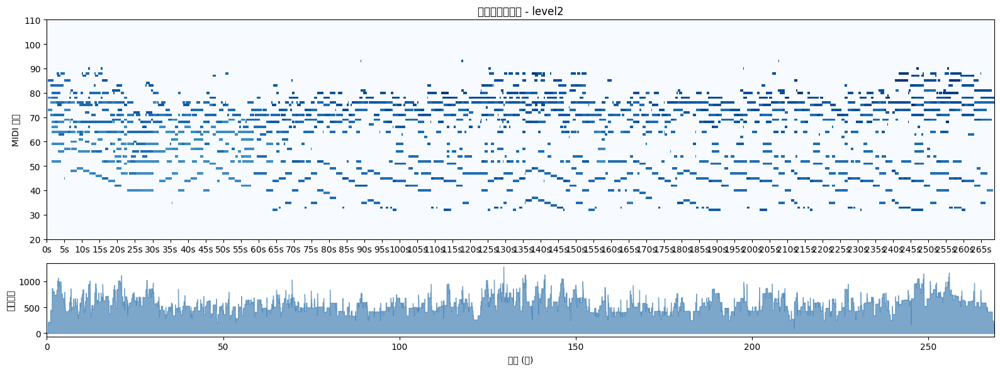


统计信息:
  总音符数: 2238
  时长: 268.74 秒
  音高范围: 32 - 93 (MIDI)
  平均力度: 83.8


In [34]:
import pretty_midi
import numpy as np
import matplotlib.pyplot as plt

def visualize_midi(midi_path, title="Piano Roll", figsize=(16, 6)):
    """可视化 MIDI 为钢琴卷帘图"""
    midi_obj = pretty_midi.PrettyMIDI(str(midi_path))
    piano_roll = midi_obj.get_piano_roll(fs=100)

    fig, axes = plt.subplots(2, 1, figsize=figsize, height_ratios=[3, 1])

    # 钢琴卷帘图
    ax1 = axes[0]
    ax1.imshow(piano_roll, aspect='auto', origin='lower', cmap='Blues', interpolation='nearest')
    ax1.set_ylabel('MIDI 音高')
    ax1.set_title(title)
    ax1.set_ylim(20, 110)

    duration = midi_obj.get_end_time()
    x_ticks = np.arange(0, piano_roll.shape[1], 500)
    ax1.set_xticks(x_ticks)
    ax1.set_xticklabels([f"{t/100:.0f}s" for t in x_ticks])

    # 音符强度
    ax2 = axes[1]
    velocity_over_time = piano_roll.sum(axis=0)
    time_axis = np.arange(len(velocity_over_time)) / 100
    ax2.fill_between(time_axis, velocity_over_time, alpha=0.7, color='steelblue')
    ax2.set_xlabel('时间 (秒)')
    ax2.set_ylabel('音符强度')
    ax2.set_xlim(0, duration)

    plt.tight_layout()
    plt.show()

    # 统计信息
    notes = midi_obj.instruments[0].notes if midi_obj.instruments else []
    print(f"\n统计信息:")
    print(f"  总音符数: {len(notes)}")
    print(f"  时长: {duration:.2f} 秒")
    if notes:
        pitches = [n.pitch for n in notes]
        print(f"  音高范围: {min(pitches)} - {max(pitches)} (MIDI)")
        print(f"  平均力度: {np.mean([n.velocity for n in notes]):.1f}")

if MIDI_OUTPUT.exists():
    visualize_midi(MIDI_OUTPUT, title=f"生成的钢琴版本 - {STYLE}")
else:
    print("请先运行转录生成 MIDI 文件")

## 9. 使用 FluidSynth 合成音频

将 MIDI 转换为 WAV 音频文件。

In [35]:
try:
    from midi2audio import FluidSynth
    
    # 使用本地安装的 FluidSynth
    FLUIDSYNTH_EXE = ROOT / "soundfonts" / "fluidsynth" / "bin" / "fluidsynth.exe"
    
    if MIDI_OUTPUT.exists() and SOUNDFONT_PATH.exists():
        if FLUIDSYNTH_EXE.exists():
            print("正在使用 FluidSynth 合成音频...")
            fs = FluidSynth(str(SOUNDFONT_PATH), fluidsynth=str(FLUIDSYNTH_EXE))
            fs.midi_to_audio(str(MIDI_OUTPUT), str(AUDIO_OUTPUT))
            print(f"音频已保存到: {AUDIO_OUTPUT}")
        else:
            print(f"FluidSynth 未安装: {FLUIDSYNTH_EXE}")
            print("请运行 'uv run python download_fluidsynth.py' 安装")
    else:
        if not MIDI_OUTPUT.exists():
            print("请先运行转录生成 MIDI 文件")
        if not SOUNDFONT_PATH.exists():
            print("请先下载 SoundFont 文件")
except Exception as e:
    print(f"FluidSynth 合成失败: {e}")
    print("\n可以使用 pretty_midi 的内置合成器作为替代:")


正在使用 FluidSynth 合成音频...
FluidSynth 合成失败: FluidSynth.__init__() got an unexpected keyword argument 'fluidsynth'

可以使用 pretty_midi 的内置合成器作为替代:


## 10. 播放音频

在 Jupyter 中直接播放合成的音频。

In [36]:
from IPython.display import Audio, display

if AUDIO_OUTPUT.exists():
    print("合成的钢琴翻唱:")
    display(Audio(str(AUDIO_OUTPUT)))
elif MIDI_OUTPUT.exists():
    # 使用 pretty_midi 内置合成器作为替代
    print("使用 pretty_midi 内置合成器播放 (音质较低):")
    midi_obj = pretty_midi.PrettyMIDI(str(MIDI_OUTPUT))
    audio = midi_obj.synthesize(fs=22050)
    if len(audio) > 0 and np.abs(audio).max() > 0:
        audio = audio / np.abs(audio).max() * 0.9
    display(Audio(audio, rate=22050))
else:
    print("没有可播放的音频，请先运行转录")

使用 pretty_midi 内置合成器播放 (音质较低):


## 11. 完整流程函数

In [37]:
def transcribe_and_synthesize(
    audio_input: str,
    midi_output: str = None,
    audio_output: str = None,
    style: str = "level2",
    soundfont: str = None,
    play_audio: bool = True
):
    """
    完整的音频转录和合成流程
    
    Args:
        audio_input: 输入音频文件路径
        midi_output: MIDI 输出路径 (默认: output/output.mid)
        audio_output: 音频输出路径 (默认: output/output.wav)
        style: 风格等级 ("level1", "level2", "level3")
        soundfont: SoundFont 文件路径
        play_audio: 是否播放音频
    """
    from IPython.display import Audio, display
    
    # 设置默认路径
    if midi_output is None:
        midi_output = str(OUTPUT_DIR / "output.mid")
    if audio_output is None:
        audio_output = str(OUTPUT_DIR / "output.wav")
    if soundfont is None:
        soundfont = str(SOUNDFONT_PATH)
    
    # 检查输入文件
    if not Path(audio_input).exists():
        raise FileNotFoundError(f"音频文件不存在: {audio_input}")
    
    # 获取风格向量
    sv = sv_sampler.sample(params=style)
    
    # 转录为 MIDI
    print(f"转录音频: {audio_input}")
    print(f"使用风格: {style}")
    pipeline.wav2midi(audio_input, midi_output, sv, silent=False)
    print(f"MIDI 已保存: {midi_output}")
    
    # 合成音频
    if Path(soundfont).exists():
        try:
            from midi2audio import FluidSynth
            print("\n正在合成音频...")
            fs = FluidSynth(soundfont)
            fs.midi_to_audio(midi_output, audio_output)
            print(f"音频已保存: {audio_output}")
            
            if play_audio:
                print("\n合成结果:")
                display(Audio(audio_output))
        except Exception as e:
            print(f"FluidSynth 合成失败: {e}")
    else:
        print(f"\nSoundFont 不存在，跳过音频合成")
    
    return midi_output, audio_output

print("函数 transcribe_and_synthesize 已准备就绪!")
print("\n使用示例:")
print('transcribe_and_synthesize(r"C:\\path\\to\\audio.wav", style="level2")')

函数 transcribe_and_synthesize 已准备就绪!

使用示例:
transcribe_and_synthesize(r"C:\path\to\audio.wav", style="level2")


## 使用示例

In [38]:
# 取消注释并修改路径来使用
# transcribe_and_synthesize(
#     r"C:\Users\chen\Desktop\your_audio.wav",
#     style="level2"  # 可选: "level1", "level2", "level3"
# )